In [2]:
!pip install denoising_diffusion_pytorch

from denoising_diffusion_pytorch.classifier_free_guidance import Unet, GaussianDiffusion
from pathlib import Path
from PIL import Image, ImageEnhance, ImageFilter
from torch.optim.lr_scheduler import CosineAnnealingLR, LinearLR, SequentialLR
from torch.utils.data import DataLoader, Dataset, DataLoader
from torchvision import transforms, datasets
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image
from tqdm import tqdm
import numpy as np
import os
import pandas as pd
import random
import shutil
import torch
import zipfile
import tarfile
import glob
import os
import json 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.7/83.7 kB 4.5 MB/s eta 0:00:00


# Checking the robustness of the results

In [9]:
import torch
from denoising_diffusion_pytorch.classifier_free_guidance import Unet, GaussianDiffusion
from torchvision.utils import save_image
from pathlib import Path
from collections import namedtuple
from functools import partial
from tqdm import tqdm

# Load model
checkpoint = torch.load('/kaggle/input/models/anton4ik/cartoon-diffussion/pytorch/default/1/checkpoint-46.pt', map_location='cuda')

model = Unet(
    dim = 48,
    dim_mults = (1, 2, 4, 8),
    num_classes = 2,
    cond_drop_prob = 0.2,
    channels = 3
)

diffusion = GaussianDiffusion(
    model,
    image_size = 128,
    timesteps = 1000,
    sampling_timesteps = 500
).cuda()

diffusion.load_state_dict(checkpoint['model'])
diffusion.eval()

# Noise config (initial latent only)
"""
There are 5 noise types:
- Normal noise: 
- Laplace
- Student t
- Uniform
- Solid color

I tried :
- changing the variance for the normal distribution.
- Adding 

"""

noise_config = {
    'type': 'normal',       # 'normal' | 'laplace' | 'student_t' | 'uniform' | 'solid_color'
    'normal_std': 10000.0,
    'laplace_scale': 1.0,
    'student_df': 3.0,
    'student_scale': 1.0,
    'uniform_low': 0.0,
    'uniform_high': 1.0,
    'solid_color_rgb': (1.0, 1.0, 0.0),
    'solid_color_jitter_std': 0.0,
    'scale_init_image': False
}

def unnormalize_to_zero_to_one(x):
    return (x + 1) * 0.5

def scale_per_image_per_channel_to_minus_one_one(x, eps=1e-8):
    if x.ndim != 4:
        raise ValueError('scale_initial_noise expects a 4D tensor (B, C, H, W).')

    x_min = x.amin(dim=(2, 3), keepdim=True)
    x_max = x.amax(dim=(2, 3), keepdim=True)
    denom = x_max - x_min

    x01 = torch.where(denom > eps, (x - x_min) / (denom + eps), torch.zeros_like(x))
    return x01 * 2 - 1

def sample_initial_noise(shape, device, cfg):
    noise_type = cfg.get('type', 'normal').lower()
    scale_initial_noise = bool(cfg.get('scale_initial_noise', False))

    def maybe_scale(x, scale_initial_noise):
        if scale_initial_noise:
            return scale_per_image_per_channel_to_minus_one_one(x)
        return x

    if noise_type == 'normal':
        std = float(cfg.get('normal_std', 1.0))
        return maybe_scale(torch.randn(shape, device=device) * std, scale_initial_noise)

    if noise_type == 'laplace':
        scale = float(cfg.get('laplace_scale', 1.0))
        dist = torch.distributions.Laplace(0.0, scale)
        return maybe_scale(dist.sample(shape).to(device), scale_initial_noise)

    if noise_type == 'student_t':
        df = float(cfg.get('student_df', 3.0))
        scale = float(cfg.get('student_scale', 1.0))
        dist = torch.distributions.StudentT(df)
        return maybe_scale(dist.sample(shape).to(device) * scale, scale_initial_noise)

    if noise_type == 'uniform':
        low = float(cfg.get('uniform_low', 0.0))
        high = float(cfg.get('uniform_high', 1.0))
        if not low < high:
            raise ValueError('uniform_low must be strictly smaller than uniform_high.')
        return maybe_scale(torch.empty(shape, device=device).uniform_(low, high))

    if noise_type == 'solid_color':
        if len(shape) != 4:
            raise ValueError('solid_color requires shape (B, C, H, W).')

        b, c, h, w = shape
        if c != 3:
            raise ValueError('solid_color requires 3 channels (RGB).')

        rgb = cfg.get('solid_color_rgb', (0.5, 0.5, 0.5))
        if len(rgb) != 3:
            raise ValueError('solid_color_rgb must contain exactly 3 values (R, G, B).')

        base = torch.tensor([float(rgb[0]), float(rgb[1]), float(rgb[2])], device=device).view(1, 3, 1, 1)
        img = base.expand(b, 3, h, w).clone()

        jitter_std = float(cfg.get('solid_color_jitter_std', 0.0))
        if jitter_std > 0:
            img = img + torch.randn_like(img) * jitter_std

        return img

    raise ValueError("Unknown noise type. Use 'normal', 'laplace', 'student_t', 'uniform', or 'solid_color'.")

# Monkey patch
ModelPrediction = namedtuple('ModelPrediction', ['pred_noise', 'pred_x_start'])

def patched_model_predictions(self, x, t, classes, cond_scale=6., rescaled_phi=0., clip_x_start=False):
    result = self.model.forward_with_cond_scale(x, t, classes=classes, cond_scale=cond_scale, rescaled_phi=rescaled_phi)
    model_output = result[0] if isinstance(result, tuple) else result
    maybe_clip = partial(torch.clamp, min=-1., max=1.) if clip_x_start else (lambda x: x)
    x_start = self.predict_start_from_noise(x, t, model_output)
    x_start = maybe_clip(x_start)
    pred_noise = self.predict_noise_from_start(x, t, x_start)
    return ModelPrediction(pred_noise, x_start)

@torch.no_grad()
def patched_p_sample_loop(self, classes, shape, cond_scale=6., rescaled_phi=0.7):
    device = self.betas.device
    img = sample_initial_noise(shape, device, noise_config) / 10_000.0

    for t in tqdm(reversed(range(0, self.num_timesteps)), desc='sampling loop time step', total=self.num_timesteps):
        img, _ = self.p_sample(img, t, classes, cond_scale, rescaled_phi)

    img = unnormalize_to_zero_to_one(img)
    return img

@torch.no_grad()
def patched_ddim_sample(self, classes, shape, cond_scale=6., rescaled_phi=0.7, clip_denoised=True):
    batch, device, total_timesteps, sampling_timesteps, eta = shape[0], self.betas.device, self.num_timesteps, self.sampling_timesteps, self.ddim_sampling_eta

    times = torch.linspace(-1, total_timesteps - 1, steps=sampling_timesteps + 1)
    times = list(reversed(times.int().tolist()))
    time_pairs = list(zip(times[:-1], times[1:]))

    img = sample_initial_noise(shape, device, noise_config)

    for time, time_next in tqdm(time_pairs, desc='sampling loop time step'):
        time_cond = torch.full((batch,), time, device=device, dtype=torch.long)
        pred_noise, x_start, *_ = self.model_predictions(img, time_cond, classes, cond_scale=cond_scale, rescaled_phi=rescaled_phi, clip_x_start=clip_denoised)

        if time_next < 0:
            img = x_start
            continue

        alpha = self.alphas_cumprod[time]
        alpha_next = self.alphas_cumprod[time_next]

        sigma = eta * ((1 - alpha / alpha_next) * (1 - alpha_next) / (1 - alpha)).sqrt()
        c = (1 - alpha_next - sigma ** 2).sqrt()

        noise = torch.randn_like(img)
        img = x_start * alpha_next.sqrt() + c * pred_noise + sigma * noise

    img = unnormalize_to_zero_to_one(img)
    return img

GaussianDiffusion.model_predictions = patched_model_predictions
GaussianDiffusion.p_sample_loop = patched_p_sample_loop
GaussianDiffusion.ddim_sample = patched_ddim_sample

# Generate
output_dir = Path('./generated')
output_dir.mkdir(exist_ok=True)

noise_type = noise_config['type']
if noise_type == 'normal':
    noise_tag = f"normal-std{noise_config['normal_std']}"
elif noise_type == 'laplace':
    noise_tag = f"laplace-scale{noise_config['laplace_scale']}"
elif noise_type == 'student_t':
    noise_tag = f"studentt-df{noise_config['student_df']}-scale{noise_config['student_scale']}"
elif noise_type == 'uniform':
    noise_tag = f"uniform-{noise_config['uniform_low']}-{noise_config['uniform_high']}"
else:
    r, g, b = noise_config['solid_color_rgb']
    noise_tag = f"solid-r{r}-g{g}-b{b}-j{noise_config['solid_color_jitter_std']}"

print(f"Generating with initial latent noise: {noise_tag}")
with torch.no_grad():
    blonde_classes = torch.zeros(10, dtype=torch.long).cuda()
    blonde_images = diffusion.sample(classes=blonde_classes, cond_scale=6.0)

    dark_classes = torch.ones(10, dtype=torch.long).cuda()
    dark_images = diffusion.sample(classes=dark_classes, cond_scale=6.0)

save_image(blonde_images, str(output_dir / 'blonde_final.png'), nrow=5, normalize=True, value_range=(-1, 1))
save_image(dark_images,   str(output_dir / 'dark_final.png'),   nrow=5, normalize=True, value_range=(-1, 1))
save_image(blonde_images, str(output_dir / f'blonde_{noise_tag}.png'), nrow=5, normalize=True, value_range=(-1, 1))
save_image(dark_images,   str(output_dir / f'dark_{noise_tag}.png'),   nrow=5, normalize=True, value_range=(-1, 1))

print('Done! Check ./generated/')

Generating with initial latent noise: normal-std10000.0


sampling loop time step: 100%|██████████| 500/500 [01:14<00:00,  6.69it/s]


Done! Check ./generated/


In [11]:
img = sample_initial_noise(shape, device, noise_config)

NameError: name 'shape' is not defined

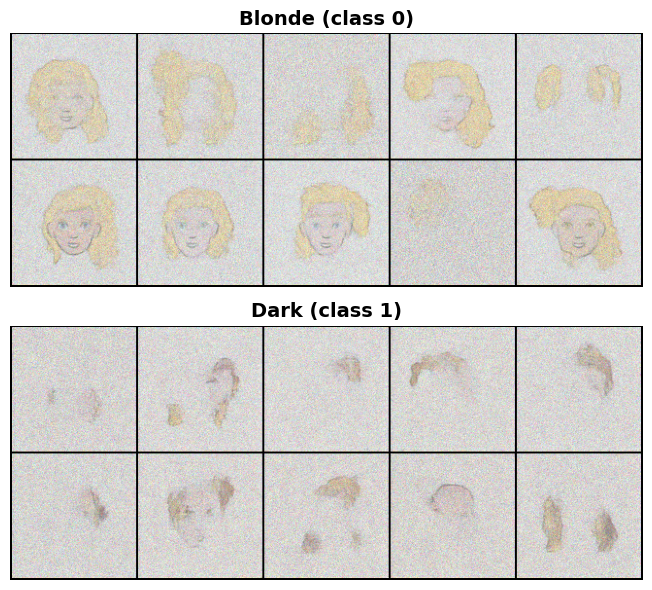

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std10000.0.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std10000.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

After scaling the initial .

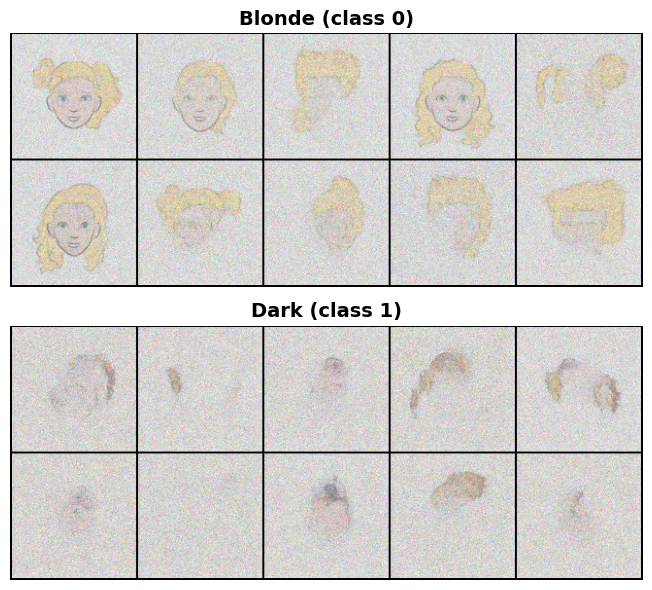

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std10000.0.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std10000.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

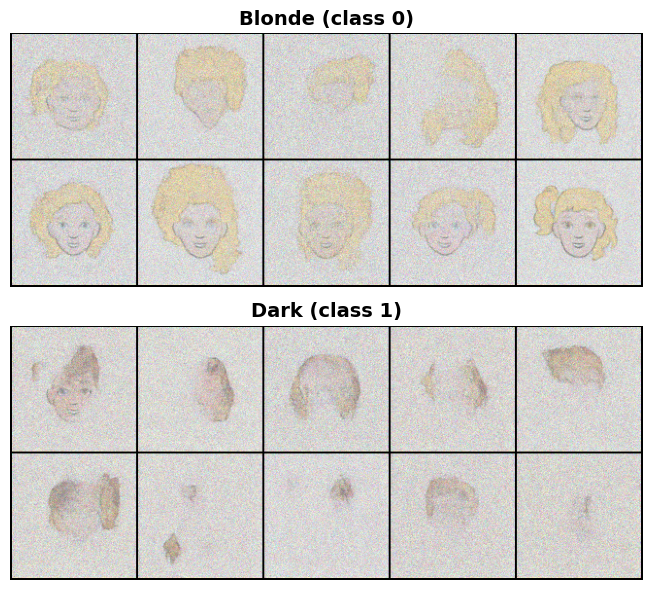

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std10000.0.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std10000.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

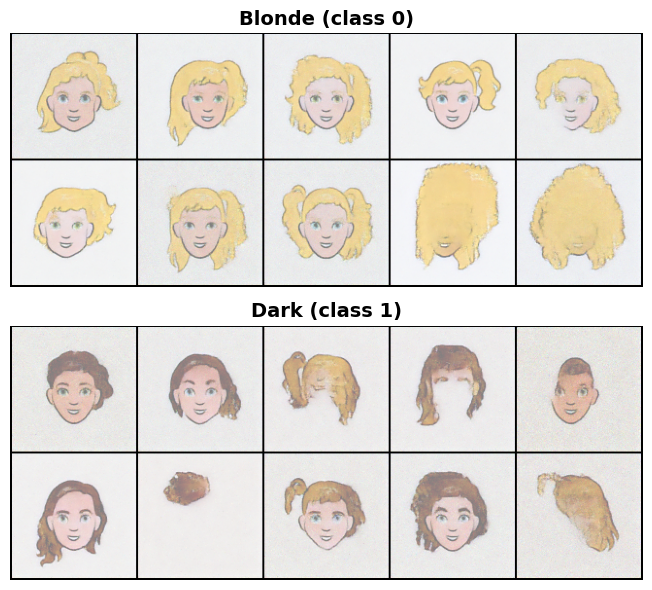

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std1000.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std1000.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

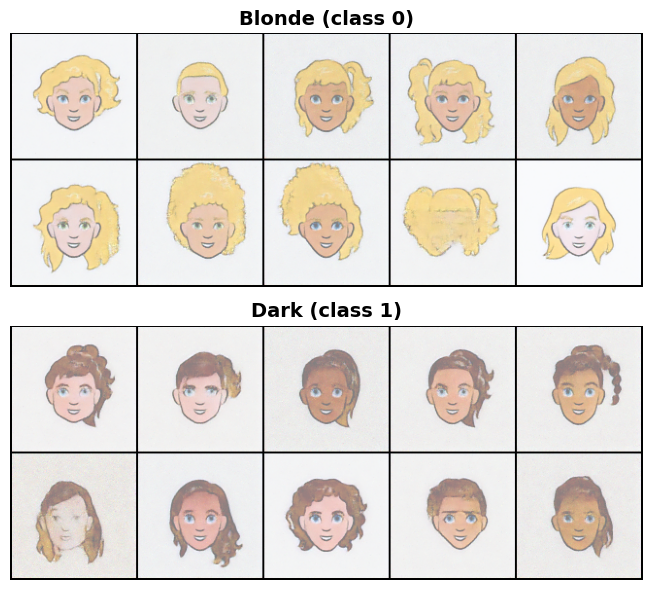

In [28]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std10.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std10.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

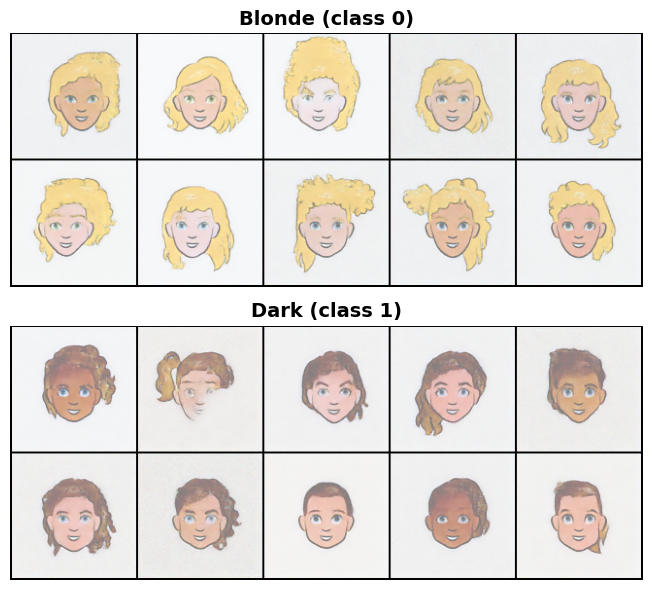

In [26]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std1.0.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std1.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

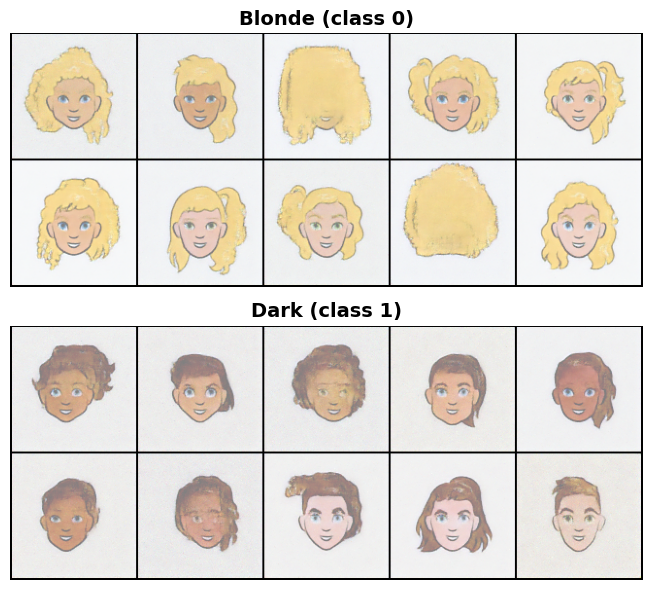

In [27]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_normal-std1e-06.png')
dark_grid   = mpimg.imread('./generated/dark_normal-std1e-06.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

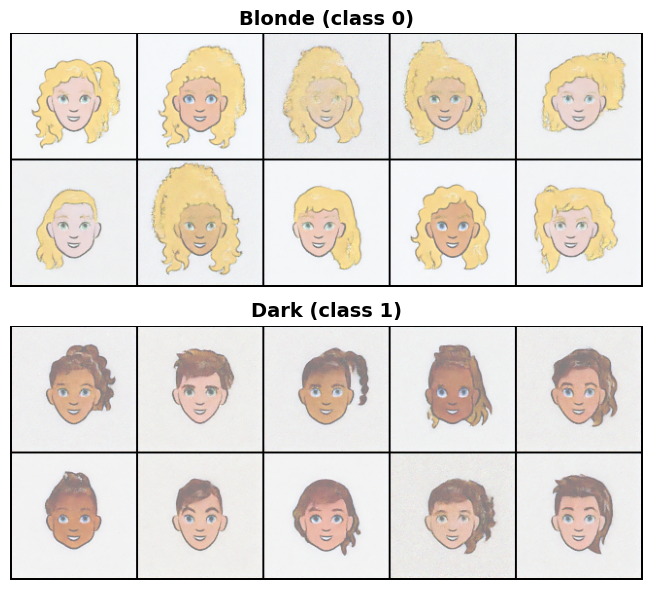

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_laplace-scale1.0.png')
dark_grid   = mpimg.imread('./generated/dark_laplace-scale1.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

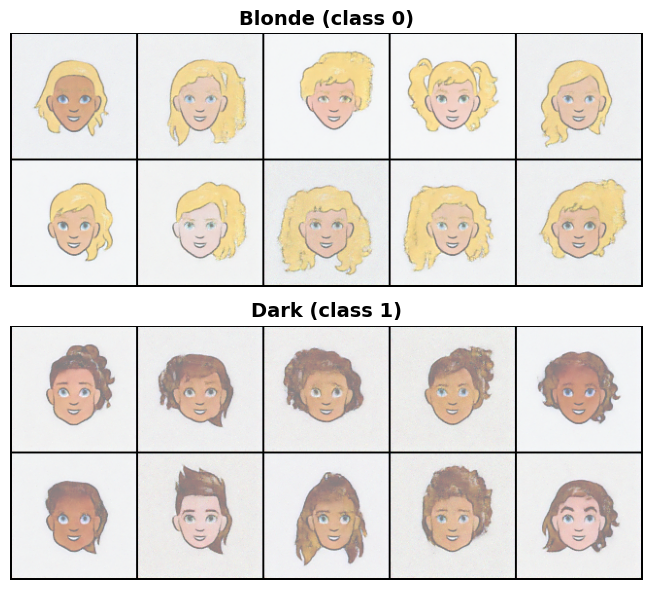

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_studentt-df3.0-scale1.0.png')
dark_grid   = mpimg.imread('./generated/dark_studentt-df3.0-scale1.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

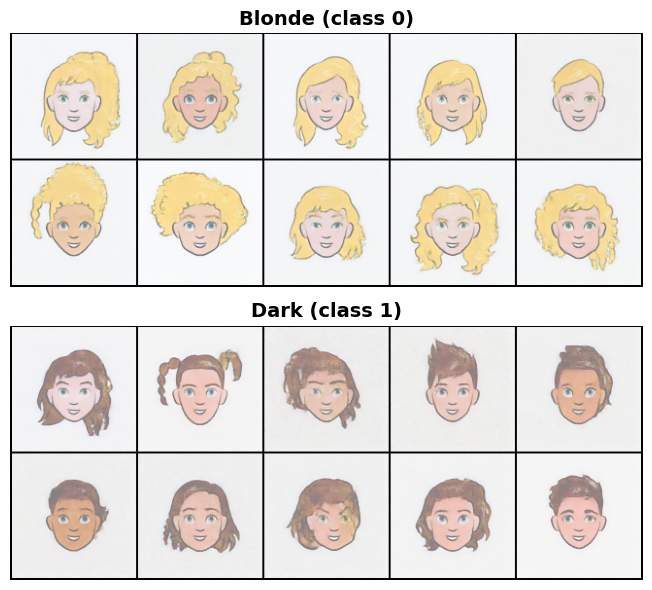

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_uniform-0.0-1.0.png')
dark_grid   = mpimg.imread('./generated/dark_uniform-0.0-1.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

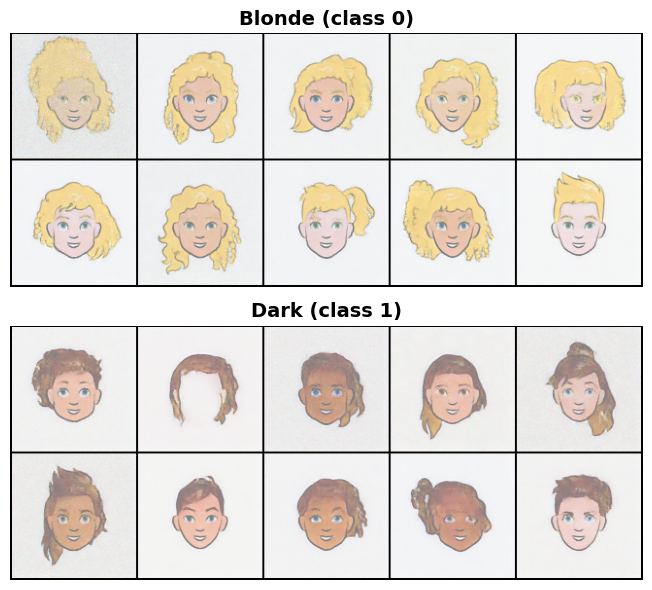

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_solid-r0.0-g0.0-b0.0-j0.0.png')
dark_grid   = mpimg.imread('./generated/dark_solid-r0.0-g0.0-b0.0-j0.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

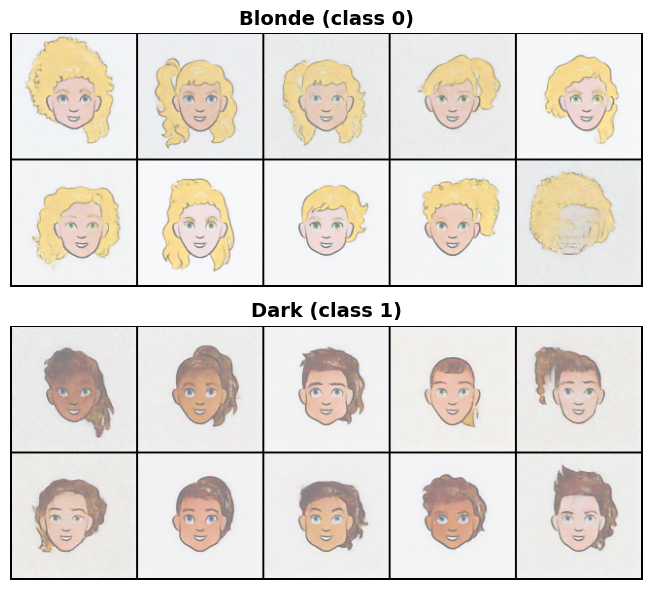

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_solid-r1.0-g0.0-b0.0-j0.0.png')
dark_grid   = mpimg.imread('./generated/dark_solid-r1.0-g0.0-b0.0-j0.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

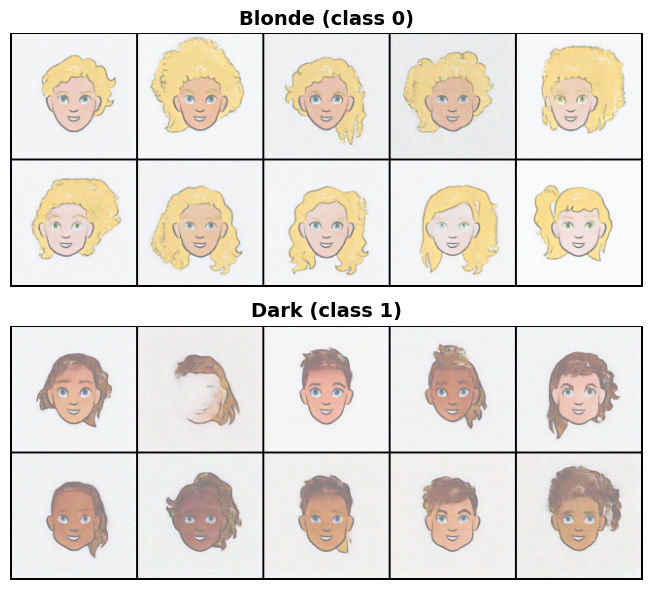

In [12]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_solid-r1.0-g1.0-b0.0-j0.0.png')
dark_grid   = mpimg.imread('./generated/dark_solid-r1.0-g1.0-b0.0-j0.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

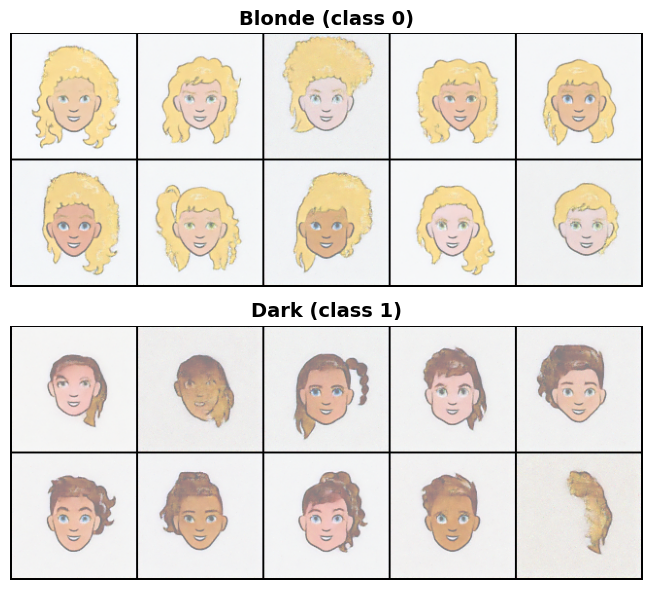

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 1, figsize=(15, 6))

blonde_grid = mpimg.imread('./generated/blonde_solid-r1.0-g1.0-b1.0-j0.0.png')
dark_grid   = mpimg.imread('./generated/dark_solid-r1.0-g1.0-b1.0-j0.0.png')

axes[0].imshow(blonde_grid)
axes[0].set_title('Blonde (class 0)', fontsize=14, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(dark_grid)
axes[1].set_title('Dark (class 1)', fontsize=14, fontweight='bold')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('./generated/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

In [13]:
import shutil
shutil.make_archive("output cartoon images", 'zip', "generated")

'/kaggle/working/output cartoon images.zip'

In [14]:
!ls

 generated  'output cartoon images.zip'
